## Data preprocessing

#### This is a notebook containing the data preprocessing. 

#### Extract the trajectories between Singapore and Rotterdam

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import movingpandas as mpd
import shapely as shp
import hvplot.pandas 
import matplotlib.pyplot as plt
from utils import *
from geopandas import GeoDataFrame, read_file
from shapely.geometry import Point, LineString, Polygon
from datetime import datetime, timedelta
from holoviews import opts, dim
from os.path import exists
from urllib.request import urlretrieve

import warnings
warnings.filterwarnings('ignore')

plot_defaults = {'linewidth':5, 'capstyle':'round', 'figsize':(9,3), 'legend':True}
opts.defaults(opts.Overlay(active_tools=['wheel_zoom'], frame_width=500, frame_height=400))
hvplot_defaults = {'tiles':None, 'cmap':'Viridis', 'colorbar':True}

mpd.show_versions()

ERROR 1: PROJ: proj_create_from_database: Open of /slurm/home/yrd/luolab/zhaoliang/.conda/envs/py310/share/proj failed



MovingPandas 0.17.2

SYSTEM INFO
-----------
python     : 3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
executable : /slurm/home/yrd/luolab/zhaoliang/.conda/envs/py310/bin/python
machine    : Linux-3.10.0-1160.el7.x86_64-x86_64-with-glibc2.17

GEOS, GDAL, PROJ INFO
---------------------
GEOS       : None
GEOS lib   : None
GDAL       : 3.8.2
GDAL data dir: /slurm/home/yrd/luolab/zhaoliang/.conda/envs/py310/share/gdal
PROJ       : 9.3.1
PROJ data dir: /slurm/home/yrd/luolab/zhaoliang/.conda/envs/py310/share/proj

PYTHON DEPENDENCIES
-------------------
geopandas  : 0.14.1
pandas     : 2.1.4
fiona      : 1.9.5
numpy      : 1.26.2
shapely    : 2.0.2
rtree      : 1.1.0
pyproj     : 3.6.1
matplotlib : 3.8.2
mapclassify: None
geopy      : 2.4.1
holoviews  : 1.18.1
hvplot     : 0.9.1
geoviews   : 1.11.0
stonesoup  : None


In [2]:
df = pd.read_csv('cleaned_data.csv')


,Unnamed: 0.1,Unnamed: 0,LLI NO,Date/Time,Lat,Lng,Distance (nm),Heading,Speed over ground,Course over ground,Draught (m),Navigation status,Destination,geometry,t
0,0,1900,10010422,2021-01-18 18:12:00,-7.846667,121.805556,52.2,272,19.1,273.2,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.80555555555556 -7.846666666666667),2021-01-18 18:12:00
1,1,1901,10010422,2021-01-18 18:46:00,-7.835556,121.629167,58.4,273,18.6,273.5,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.62916666666666 -7.835555555555556),2021-01-18 18:46:00
2,2,1902,10010422,2021-01-18 19:15:00,-7.826111,121.471667,62.4,289,19.3,287.2,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.47166666666666 -7.826111111111111),2021-01-18 19:15:00
3,3,1903,10010422,2021-01-18 19:48:00,-7.749444,121.314722,69.0,295,19.1,296.9,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.31472222222222 -7.749444444444444),2021-01-18 19:48:00
4,4,1904,10010422,2021-01-18 19:53:00,-7.735833,121.287778,70.2,295,19.2,296.7,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.28777777777778 -7.735833333333334),2021-01-18 19:53:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32401231,55694183,22421,9997211,2021-12-31 00:17:00,31.938611,120.144444,1.9,-,7.7,285.8,3.6,Under Way,NANJINGETA: 31 Dec 2021,POINT (120.14444444444445 31.93861111111111),2021-12-31 00:17:00
32401232,55694184,22422,9997211,2021-12-31 00:27:00,31.944444,120.121944,0.7,-,7.8,286.5,3.6,Under Way,NANJINGETA: 31 Dec 2021,POINT (120.12194444444444 31.944444444444446),2021-12-31 00:27:00
32401233,55694185,22423,9997211,2021-12-31 00:35:00,31.950000,120.100556,0.5,-,7.6,288.2,3.6,Under Way,NANJINGETA: 31 Dec 2021,POINT (120.10055555555554 31.95),2021-12-31 00:35:00
32401234,55694186,22424,9997211,2021-12-31 00:58:00,31.964444,120.048889,3.1,-,7.3,289.9,3.6,Under Way,NANJINGETA: 31 Dec 2021,POINT (120.04888888888888 31.96444444444444),2021-12-31 00:58:00


In [3]:
# df

In [3]:
df["t"] = pd.to_datetime(df["t"])
df['Quarter'] = df['t'].dt.quarter
df.head()

,Unnamed: 0.1,Unnamed: 0,LLI NO,Date/Time,Lat,Lng,Distance (nm),Heading,Speed over ground,Course over ground,Draught (m),Navigation status,Destination,geometry,t,Quarter
0,0,1900,10010422,2021-01-18 18:12:00,-7.846667,121.805556,52.2,272,19.1,273.2,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.80555555555556 -7.846666666666667),2021-01-18 18:12:00,1
1,1,1901,10010422,2021-01-18 18:46:00,-7.835556,121.629167,58.4,273,18.6,273.5,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.62916666666666 -7.835555555555556),2021-01-18 18:46:00,1
2,2,1902,10010422,2021-01-18 19:15:00,-7.826111,121.471667,62.4,289,19.3,287.2,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.47166666666666 -7.826111111111111),2021-01-18 19:15:00,1
3,3,1903,10010422,2021-01-18 19:48:00,-7.749444,121.314722,69.0,295,19.1,296.9,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.31472222222222 -7.749444444444444),2021-01-18 19:48:00,1
4,4,1904,10010422,2021-01-18 19:53:00,-7.735833,121.287778,70.2,295,19.2,296.7,12.1,Under Way,MYTPPETA: 21 Jan 2021,POINT (121.28777777777778 -7.735833333333334),2021-01-18 19:53:00,1


2021年所有数据

In [4]:
# df_spring = df[df['Quarter']==1]
df = df[df['Lng'] < 103.95]
df = df[df['Lat'] < 52.05]
print(df_spring.shape[0])

20365583


In [5]:
# df_spring.head()

In [6]:
# df_spring = df_spring.drop('Quarter', axis = 1)

In [7]:
# plt.scatter(df_spring['Lng'], df_spring['Lat'])

In [8]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df_spring.Lng, df_spring.Lat))
traj_collection = mpd.TrajectoryCollection(gdf, 'LLI NO', t='t', crs=None)
print(f"Finished creating {len(traj_collection)} trajectories")

Finished creating 2130 trajectories


In [10]:
# area_of_nl = Polygon([(3.93911, 51.99683), (4.10631,  51.99683), (4.10631, 51.92172), (3.93911, 51.92172)]) # original area
area_of_nl = Polygon([(2.0, 51.2), (4.10631,  51.2), (4.10631, 52.5), (2.0, 52.5)])
area_of_sg = Polygon([(104.14696, 1.50427), (103.30788, 1.50427), (103.31337, 1.18438), (104.13734, 1.18438)])


new_inter1 = find_intersection(traj_collection, area_of_sg, area_of_nl)
print(f"Found {len(new_inter1)} intersections with singapore and rotterdam")

Found 260 trajectories
Found 260 intersections with singapore and rotterdam


In [11]:
# new_inter1.plot(linewidth=1, capstyle='round')

In [14]:
# my_traj = traj_collection.trajectories[0]
# my_traj = mpd.TemporalSplitter(new_inter).split(min_length = 8)
traj = mpd.ObservationGapSplitter(new_inter1).split(gap=timedelta(hours=72))
print(f"Found {len(traj)} trajectories")

Found 2656 trajectories


In [15]:
new_inter = find_intersection(traj, area_of_sg, area_of_nl)
print(f"Found {len(new_inter)} intersections")

Found 647 trajectories
Found 647 intersections


<Axes: >

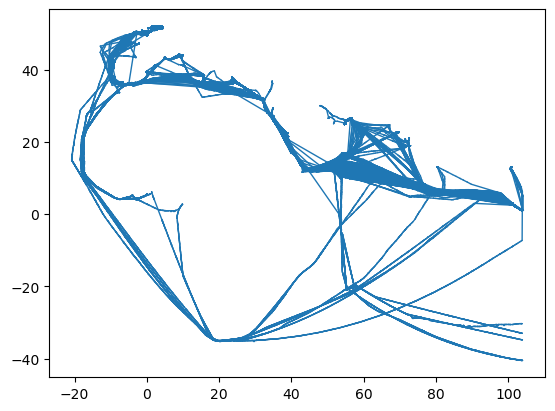

In [18]:
new_inter.plot(linewidth=1, capstyle='round')

In [19]:
new_inter_DP = mpd.DouglasPeuckerGeneralizer(new_inter).generalize(tolerance=0.5)

In [20]:
new_inter_DP.hvplot(title='Trajectories', color = 'r', line_width=2, frame_width=1000, frame_height=800, tiles='EsriNatGeo')

:Overlay
   .WMTS.I             :WMTS   [Longitude,Latitude]
   .Path.I             :Path   [Longitude,Latitude]
   .Path.II            :Path   [Longitude,Latitude]
   .Path.III           :Path   [Longitude,Latitude]
   .Path.IV            :Path   [Longitude,Latitude]
   .Path.V             :Path   [Longitude,Latitude]
   .Path.VI            :Path   [Longitude,Latitude]
   .Path.VII           :Path   [Longitude,Latitude]
   .Path.VIII          :Path   [Longitude,Latitude]
   .Path.IX            :Path   [Longitude,Latitude]
   .Path.X             :Path   [Longitude,Latitude]
   .Path.XI            :Path   [Longitude,Latitude]
   .Path.XII           :Path   [Longitude,Latitude]
   .Path.XIII          :Path   [Longitude,Latitude]
   .Path.XIV           :Path   [Longitude,Latitude]
   .Path.XV            :Path   [Longitude,Latitude]
   .Path.XVI           :Path   [Longitude,Latitude]
   .Path.XVII          :Path   [Longitude,Latitude]
   .Path.XVIII         :Path   [Longitude,Latitude]
   .Path.XIX           :Path   [Longitude,Latitude]
   .Path.XX            :Path   [Longitude,Latitude]
   .Path.XXI           :Path   [Longitude,Latitude]
   .Path.XXII          :Path   [Longitude,Latitude]
   .Path.XXIII         :Path   [Longitude,Latitude]
   .Path.XXIV          :Path   [Longitude,Latitude]
   .Path.XXV           :Path   [Longitude,Latitude]
   .Path.XXVI          :Path   [Longitude,Latitude]
   .Path.XXVII         :Path   [Longitude,Latitude]
   .Path.XXVIII        :Path   [Longitude,Latitude]
   .Path.XXIX          :Path   [Longitude,Latitude]
   .Path.XXX           :Path   [Longitude,Latitude]
   .Path.XXXI          :Path   [Longitude,Latitude]
   .Path.XXXII         :Path   [Longitude,Latitude]
   .Path.XXXIII        :Path   [Longitude,Latitude]
   .Path.XXXIV         :Path   [Longitude,Latitude]
   .Path.XXXV          :Path   [Longitude,Latitude]
   .Path.XXXVI         :Path   [Longitude,Latitude]
   .Path.XXXVII        :Path   [Longitude,Latitude]
   .Path.XXXVIII       :Path   [Longitude,Latitude]
   .Path.XXXIX         :Path   [Longitude,Latitude]
   .Path.XL            :Path   [Longitude,Latitude]
   .Path.XLI           :Path   [Longitude,Latitude]
   .Path.XLII          :Path   [Longitude,Latitude]
   .Path.XLIII         :Path   [Longitude,Latitude]
   .Path.XLIV          :Path   [Longitude,Latitude]
   .Path.XLV           :Path   [Longitude,Latitude]
   .Path.XLVI          :Path   [Longitude,Latitude]
   .Path.XLVII         :Path   [Longitude,Latitude]
   .Path.XLVIII        :Path   [Longitude,Latitude]
   .Path.XLIX          :Path   [Longitude,Latitude]
   .Path.L             :Path   [Longitude,Latitude]
   .Path.LI            :Path   [Longitude,Latitude]
   .Path.LII           :Path   [Longitude,Latitude]
   .Path.LIII          :Path   [Longitude,Latitude]
   .Path.LIV           :Path   [Longitude,Latitude]
   .Path.LV            :Path   [Longitude,Latitude]
   .Path.LVI           :Path   [Longitude,Latitude]
   .Path.LVII          :Path   [Longitude,Latitude]
   .Path.LVIII         :Path   [Longitude,Latitude]
   .Path.LIX           :Path   [Longitude,Latitude]
   .Path.LX            :Path   [Longitude,Latitude]
   .Path.LXI           :Path   [Longitude,Latitude]
   .Path.LXII          :Path   [Longitude,Latitude]
   .Path.LXIII         :Path   [Longitude,Latitude]
   .Path.LXIV          :Path   [Longitude,Latitude]
   .Path.LXV           :Path   [Longitude,Latitude]
   .Path.LXVI          :Path   [Longitude,Latitude]
   .Path.LXVII         :Path   [Longitude,Latitude]
   .Path.LXVIII        :Path   [Longitude,Latitude]
   .Path.LXIX          :Path   [Longitude,Latitude]
   .Path.LXX           :Path   [Longitude,Latitude]
   .Path.LXXI          :Path   [Longitude,Latitude]
   .Path.LXXII         :Path   [Longitude,Latitude]
   .Path.LXXIII        :Path   [Longitude,Latitude]
   .Path.LXXIV         :Path   [Longitude,Latitude]
   .Path.LXXV          :Path   [Longitude,Latitude]
   .Path.LXXVI         :Path   [Longitu

In [16]:
list_traj = [traje for traje in new_inter if ((traje.get_start_location().intersects(area_of_sg) and traje.get_end_location().intersects(area_of_nl)) or (traje.get_start_location().intersects(area_of_nl) and traje.get_end_location().intersects(area_of_sg)))]
print(f"Found {len(list_traj)} routes")
traj_collection = mpd.TrajectoryCollection(list_traj)

Found 520 routes


<Axes: >

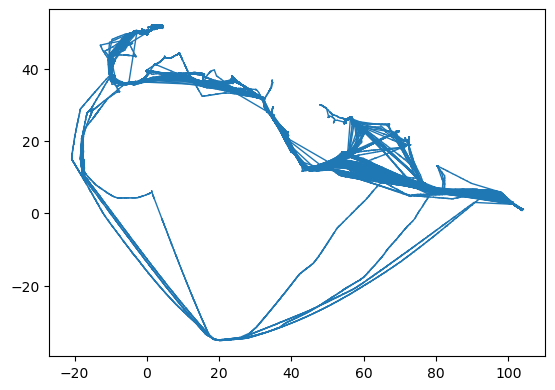

In [17]:
traj_collection.plot(linewidth=1, capstyle='round')

In [21]:
traj_collection_DP = mpd.DouglasPeuckerGeneralizer(traj_collection).generalize(tolerance=0.5)
traj_collection_DP.hvplot(title='Trajectories', color = 'r', line_width=2, frame_width=1000, frame_height=800, tiles='EsriNatGeo')

:Overlay
   .WMTS.I             :WMTS   [Longitude,Latitude]
   .Path.I             :Path   [Longitude,Latitude]
   .Path.II            :Path   [Longitude,Latitude]
   .Path.III           :Path   [Longitude,Latitude]
   .Path.IV            :Path   [Longitude,Latitude]
   .Path.V             :Path   [Longitude,Latitude]
   .Path.VI            :Path   [Longitude,Latitude]
   .Path.VII           :Path   [Longitude,Latitude]
   .Path.VIII          :Path   [Longitude,Latitude]
   .Path.IX            :Path   [Longitude,Latitude]
   .Path.X             :Path   [Longitude,Latitude]
   .Path.XI            :Path   [Longitude,Latitude]
   .Path.XII           :Path   [Longitude,Latitude]
   .Path.XIII          :Path   [Longitude,Latitude]
   .Path.XIV           :Path   [Longitude,Latitude]
   .Path.XV            :Path   [Longitude,Latitude]
   .Path.XVI           :Path   [Longitude,Latitude]
   .Path.XVII          :Path   [Longitude,Latitude]
   .Path.XVIII         :Path   [Longitude,Latitude]
   .Path.XIX           :Path   [Longitude,Latitude]
   .Path.XX            :Path   [Longitude,Latitude]
   .Path.XXI           :Path   [Longitude,Latitude]
   .Path.XXII          :Path   [Longitude,Latitude]
   .Path.XXIII         :Path   [Longitude,Latitude]
   .Path.XXIV          :Path   [Longitude,Latitude]
   .Path.XXV           :Path   [Longitude,Latitude]
   .Path.XXVI          :Path   [Longitude,Latitude]
   .Path.XXVII         :Path   [Longitude,Latitude]
   .Path.XXVIII        :Path   [Longitude,Latitude]
   .Path.XXIX          :Path   [Longitude,Latitude]
   .Path.XXX           :Path   [Longitude,Latitude]
   .Path.XXXI          :Path   [Longitude,Latitude]
   .Path.XXXII         :Path   [Longitude,Latitude]
   .Path.XXXIII        :Path   [Longitude,Latitude]
   .Path.XXXIV         :Path   [Longitude,Latitude]
   .Path.XXXV          :Path   [Longitude,Latitude]
   .Path.XXXVI         :Path   [Longitude,Latitude]
   .Path.XXXVII        :Path   [Longitude,Latitude]
   .Path.XXXVIII       :Path   [Longitude,Latitude]
   .Path.XXXIX         :Path   [Longitude,Latitude]
   .Path.XL            :Path   [Longitude,Latitude]
   .Path.XLI           :Path   [Longitude,Latitude]
   .Path.XLII          :Path   [Longitude,Latitude]
   .Path.XLIII         :Path   [Longitude,Latitude]
   .Path.XLIV          :Path   [Longitude,Latitude]
   .Path.XLV           :Path   [Longitude,Latitude]
   .Path.XLVI          :Path   [Longitude,Latitude]
   .Path.XLVII         :Path   [Longitude,Latitude]
   .Path.XLVIII        :Path   [Longitude,Latitude]
   .Path.XLIX          :Path   [Longitude,Latitude]
   .Path.L             :Path   [Longitude,Latitude]
   .Path.LI            :Path   [Longitude,Latitude]
   .Path.LII           :Path   [Longitude,Latitude]
   .Path.LIII          :Path   [Longitude,Latitude]
   .Path.LIV           :Path   [Longitude,Latitude]
   .Path.LV            :Path   [Longitude,Latitude]
   .Path.LVI           :Path   [Longitude,Latitude]
   .Path.LVII          :Path   [Longitude,Latitude]
   .Path.LVIII         :Path   [Longitude,Latitude]
   .Path.LIX           :Path   [Longitude,Latitude]
   .Path.LX            :Path   [Longitude,Latitude]
   .Path.LXI           :Path   [Longitude,Latitude]
   .Path.LXII          :Path   [Longitude,Latitude]
   .Path.LXIII         :Path   [Longitude,Latitude]
   .Path.LXIV          :Path   [Longitude,Latitude]
   .Path.LXV           :Path   [Longitude,Latitude]
   .Path.LXVI          :Path   [Longitude,Latitude]
   .Path.LXVII         :Path   [Longitude,Latitude]
   .Path.LXVIII        :Path   [Longitude,Latitude]
   .Path.LXIX          :Path   [Longitude,Latitude]
   .Path.LXX           :Path   [Longitude,Latitude]
   .Path.LXXI          :Path   [Longitude,Latitude]
   .Path.LXXII         :Path   [Longitude,Latitude]
   .Path.LXXIII        :Path   [Longitude,Latitude]
   .Path.LXXIV         :Path   [Longitude,Latitude]
   .Path.LXXV          :Path   [Longitude,Latitude]
   .Path.LXXVI         :Path   [Longitu

In [22]:
# new_inter.trajectories[0].add_distance(overwrite=True, name='distance', units='m')
# traj_collection.to_point_gdf().to_csv('intersection_2021_72.csv')

In [18]:
new_inter.to_traj_gdf()

,LLI NO,start_t,end_t,geometry,length,direction
0,290412_3,2021-09-17 12:01:00,2021-10-14 21:48:00,"LINESTRING (103.93861 1.24139, 103.92333 1.234...",151.924865,296.707239
1,293032_0,2021-02-11 03:25:00,2021-03-03 16:54:00,"LINESTRING (103.94250 1.24194, 103.92556 1.236...",151.790644,296.648878
2,302051_0,2021-02-21 15:46:00,2021-03-22 00:46:00,"LINESTRING (103.94028 1.23472, 103.92444 1.228...",155.254622,296.691355
3,302051_2,2021-04-03 16:43:00,2021-04-25 22:03:00,"LINESTRING (2.81139 52.04528, 2.79222 52.03222...",154.091968,116.756721
4,308823_10,2021-08-02 20:05:00,2021-08-25 05:42:00,"LINESTRING (2.76111 52.04194, 2.74250 52.02944...",153.021233,116.672109
...,...,...,...,...,...,...
413,12990010_8,2021-10-18 19:24:00,2021-11-15 09:17:00,"LINESTRING (103.93639 1.23361, 103.91972 1.227...",153.750007,296.921528
414,13283786_0,2021-10-01 16:53:00,2021-10-20 16:45:00,"LINESTRING (103.94833 1.23667, 103.93222 1.230...",152.105797,296.919046
415,13283849_0,2021-11-21 21:01:00,2021-12-15 03:09:00,"LINESTRING (103.94778 1.23556, 103.93222 1.229...",152.047559,296.915643
416,13318353_0,2021-07-09 08:12:00,2021-08-07 11:53:00,"LINESTRING (103.94333 1.23528, 103.92750 1.229...",151.147279,296.700418


<Axes: >

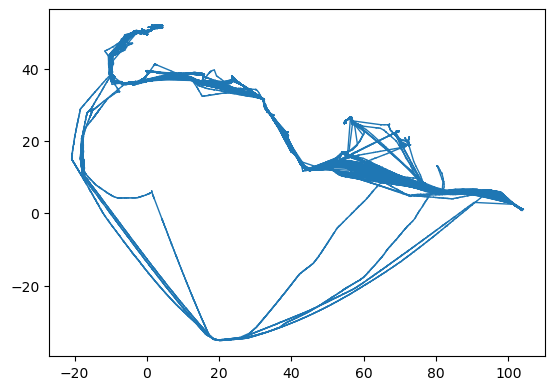

In [57]:
traj_collection.plot(linewidth=1, capstyle='round')

<Axes: >

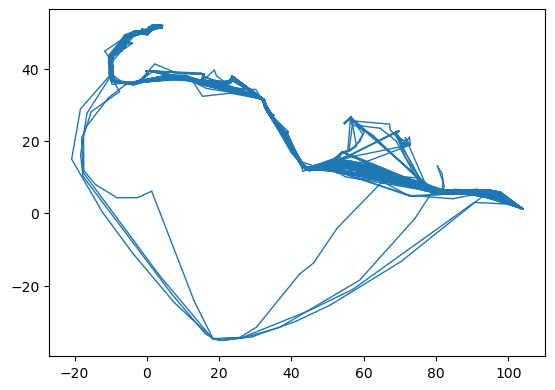

In [42]:
# traj_TD = STcompression(new_inter, 0.5)

In [43]:
# new_inter.plot(linewidth=1, capstyle='round')

In [44]:
# new_inter1.plot(linewidth=1, capstyle='round')

In [59]:
traj_DP.hvplot(title='Trajectories', color = 'r', line_width=2, frame_width=1000, frame_height=800, tiles='EsriNatGeo')

:Overlay
   .WMTS.I            :WMTS   [Longitude,Latitude]
   .Path.I            :Path   [Longitude,Latitude]
   .Path.II           :Path   [Longitude,Latitude]
   .Path.III          :Path   [Longitude,Latitude]
   .Path.IV           :Path   [Longitude,Latitude]
   .Path.V            :Path   [Longitude,Latitude]
   .Path.VI           :Path   [Longitude,Latitude]
   .Path.VII          :Path   [Longitude,Latitude]
   .Path.VIII         :Path   [Longitude,Latitude]
   .Path.IX           :Path   [Longitude,Latitude]
   .Path.X            :Path   [Longitude,Latitude]
   .Path.XI           :Path   [Longitude,Latitude]
   .Path.XII          :Path   [Longitude,Latitude]
   .Path.XIII         :Path   [Longitude,Latitude]
   .Path.XIV          :Path   [Longitude,Latitude]
   .Path.XV           :Path   [Longitude,Latitude]
   .Path.XVI          :Path   [Longitude,Latitude]
   .Path.XVII         :Path   [Longitude,Latitude]
   .Path.XVIII        :Path   [Longitude,Latitude]
   .Path.XIX          :Path   [Longitude,Latitude]
   .Path.XX           :Path   [Longitude,Latitude]
   .Path.XXI          :Path   [Longitude,Latitude]
   .Path.XXII         :Path   [Longitude,Latitude]
   .Path.XXIII        :Path   [Longitude,Latitude]
   .Path.XXIV         :Path   [Longitude,Latitude]
   .Path.XXV          :Path   [Longitude,Latitude]
   .Path.XXVI         :Path   [Longitude,Latitude]
   .Path.XXVII        :Path   [Longitude,Latitude]
   .Path.XXVIII       :Path   [Longitude,Latitude]
   .Path.XXIX         :Path   [Longitude,Latitude]
   .Path.XXX          :Path   [Longitude,Latitude]
   .Path.XXXI         :Path   [Longitude,Latitude]
   .Path.XXXII        :Path   [Longitude,Latitude]
   .Path.XXXIII       :Path   [Longitude,Latitude]
   .Path.XXXIV        :Path   [Longitude,Latitude]
   .Path.XXXV         :Path   [Longitude,Latitude]
   .Path.XXXVI        :Path   [Longitude,Latitude]
   .Path.XXXVII       :Path   [Longitude,Latitude]
   .Path.XXXVIII      :Path   [Longitude,Latitude]
   .Path.XXXIX        :Path   [Longitude,Latitude]
   .Path.XL           :Path   [Longitude,Latitude]
   .Path.XLI          :Path   [Longitude,Latitude]
   .Path.XLII         :Path   [Longitude,Latitude]
   .Path.XLIII        :Path   [Longitude,Latitude]
   .Path.XLIV         :Path   [Longitude,Latitude]
   .Path.XLV          :Path   [Longitude,Latitude]
   .Path.XLVI         :Path   [Longitude,Latitude]
   .Path.XLVII        :Path   [Longitude,Latitude]
   .Path.XLVIII       :Path   [Longitude,Latitude]
   .Path.XLIX         :Path   [Longitude,Latitude]
   .Path.L            :Path   [Longitude,Latitude]
   .Path.LI           :Path   [Longitude,Latitude]
   .Path.LII          :Path   [Longitude,Latitude]
   .Path.LIII         :Path   [Longitude,Latitude]
   .Path.LIV          :Path   [Longitude,Latitude]
   .Path.LV           :Path   [Longitude,Latitude]
   .Path.LVI          :Path   [Longitude,Latitude]
   .Path.LVII         :Path   [Longitude,Latitude]
   .Path.LVIII        :Path   [Longitude,Latitude]
   .Path.LIX          :Path   [Longitude,Latitude]
   .Path.LX           :Path   [Longitude,Latitude]
   .Path.LXI          :Path   [Longitude,Latitude]
   .Path.LXII         :Path   [Longitude,Latitude]
   .Path.LXIII        :Path   [Longitude,Latitude]
   .Path.LXIV         :Path   [Longitude,Latitude]
   .Path.LXV          :Path   [Longitude,Latitude]
   .Path.LXVI         :Path   [Longitude,Latitude]
   .Path.LXVII        :Path   [Longitude,Latitude]
   .Path.LXVIII       :Path   [Longitude,Latitude]
   .Path.LXIX         :Path   [Longitude,Latitude]
   .Path.LXX          :Path   [Longitude,Latitude]
   .Path.LXXI         :Path   [Longitude,Latitude]
   .Path.LXXII        :Path   [Longitude,Latitude]
   .Path.LXXIII       :Path   [Longitude,Latitude]
   .Path.LXXIV        :Path   [Longitude,Latitude]
   .Path.LXXV         :Path   [Longitude,Latitude]
   .Path.LXXVI        :Path   [Longitude,Latitude]
   .Path.LXXVII       :Path   [Longitude,Latitude]
   .Path.LXXV

NameError: name 'traj_TD' is not defined

Trajectory 12077847_2 (2021-02-06 09:38:00 to 2021-03-02 01:36:00) | Size: 12 | Length: 151.2m
Bounds: (-9.761111111111113, 1.2425000000000002, 103.94666666666669, 51.94833333333333)
LINESTRING (103.94666666666669 1.2425000000000002, 97.49722222222222 5.560833333333333, 80.446944444


:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Path.I   :Path   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (triangle_angle)

In [30]:
# my_traj = mpd.ObservationGapSplitter(my_traj).split(gap=timedelta(minutes=60))
# print(f"Finished creating {len(traj_collection)} trajectories")